# Import Libraries

In [1]:
import pandas as pd           
import numpy as np
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation
import plotly.express as px                 #visualisation
import plotly.graph_objects as go
import missingno as msno                           #Heat Map for NAN Values
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler   #DATA SCALING  
from sklearn.model_selection import train_test_split   #SPLIT THE DATA 

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

%matplotlib inline
sns.set(color_codes=True)

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


# Data Reading

In [3]:
df = pd.read_csv('cardataset/data.csv')
df

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920


# DATA Details

In [4]:
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

In [6]:
df.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [7]:
df.columns

Index(['Make', 'Model', 'Year', 'Engine Fuel Type', 'Engine HP',
       'Engine Cylinders', 'Transmission Type', 'Driven_Wheels',
       'Number of Doors', 'Market Category', 'Vehicle Size', 'Vehicle Style',
       'highway MPG', 'city mpg', 'Popularity', 'MSRP'],
      dtype='object')

In [8]:
df.shape

(11914, 16)

In [9]:
df.count()

Make                 11914
Model                11914
Year                 11914
Engine Fuel Type     11911
Engine HP            11845
Engine Cylinders     11884
Transmission Type    11914
Driven_Wheels        11914
Number of Doors      11908
Market Category       8172
Vehicle Size         11914
Vehicle Style        11914
highway MPG          11914
city mpg             11914
Popularity           11914
MSRP                 11914
dtype: int64

 
 * Data Preprocessing
 * Data Cleaning
 * Visualization

In [10]:
df= df.rename(columns={"Engine HP": "HP","Engine Cylinders":"Cylinders","Transmission Type":"Transmission", "Driven_Wheels": "Drive Mode","highway MPG": "MPG-H", "city mpg": "MPG-C", "MSRP": "Price" })
df.head(5)

,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Market Category,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


<Axes: >

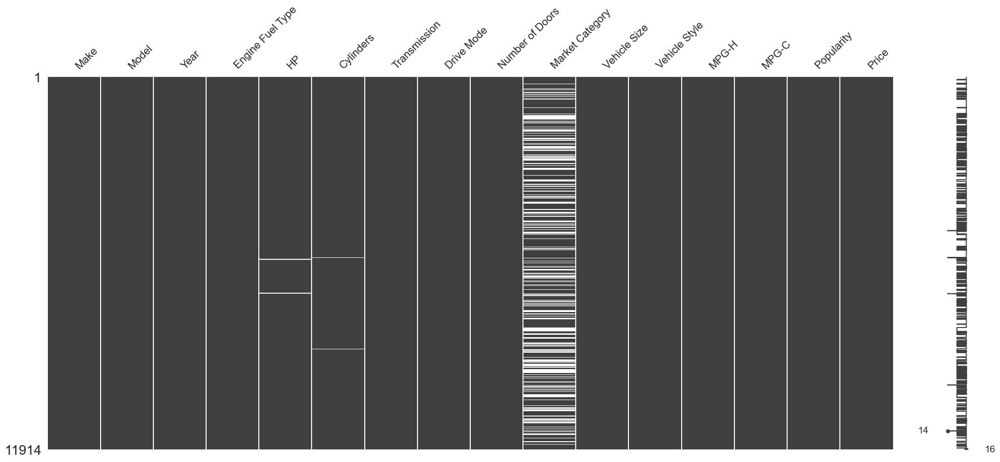

In [11]:
msno.matrix(df)

In [12]:
print(df.isnull().sum())

Make                   0
Model                  0
Year                   0
Engine Fuel Type       3
HP                    69
Cylinders             30
Transmission           0
Drive Mode             0
Number of Doors        6
Market Category     3742
Vehicle Size           0
Vehicle Style          0
MPG-H                  0
MPG-C                  0
Popularity             0
Price                  0
dtype: int64


In [13]:
df['Cylinders'] = df['Cylinders'].fillna(value=df['Cylinders'].mode()[0])  
df['Engine Fuel Type'] = df['Engine Fuel Type'].fillna(df['Engine Fuel Type'].mode()[0])
df['HP'] = df['HP'].fillna(df['HP'].mean())
df['Number of Doors']=df['Number of Doors'].fillna(df['Number of Doors'].mode()[0])   

In [14]:
df=df.drop([ "Market Category"], axis = 1)

In [15]:
print(df.isnull().sum())

Make                0
Model               0
Year                0
Engine Fuel Type    0
HP                  0
Cylinders           0
Transmission        0
Drive Mode          0
Number of Doors     0
Vehicle Size        0
Vehicle Style       0
MPG-H               0
MPG-C               0
Popularity          0
Price               0
dtype: int64


In [16]:
car_dataset=df

In [17]:
unique_car_names_count = df['Make'].nunique()

# Data Visualization 

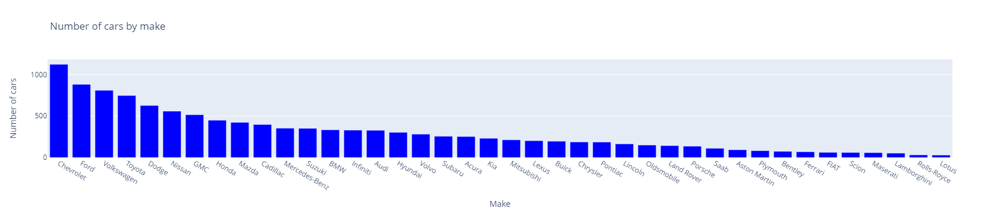

In [18]:
fig = go.Figure()

make_counts = df['Make'].value_counts().nlargest(40)

fig.add_trace(go.Bar(
    x=make_counts.index,
    y=make_counts.values,
    marker_color='blue'
))

fig.update_layout(
    title="Number of cars by make",
    xaxis_title="Make",
    yaxis_title="Number of cars"
)

fig.show()


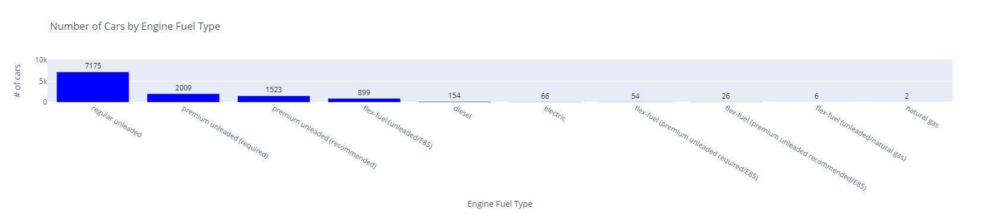

In [19]:
engine_fuel_counts = car_dataset['Engine Fuel Type'].value_counts()

fig = go.Figure(data=[go.Bar(
    x=engine_fuel_counts.index,
    y=engine_fuel_counts,
    marker_color='blue' 
)])


for i, count in enumerate(engine_fuel_counts):
    fig.add_annotation(
        x=engine_fuel_counts.index[i],
        y=count + 0.5,  # Adjust the position of the text
        text=str(count),
        showarrow=False,
        font=dict(color='black', size=12),
        xanchor='center',
        yanchor='bottom'
    )


fig.update_layout(
    title="Number of Cars by Engine Fuel Type",
    xaxis_title="Engine Fuel Type",
    yaxis_title="# of cars",
    xaxis=dict(type='category'), # This ensures that the x-axis categories are treated as categories
    yaxis=dict(title='# of cars')
)


fig.show()


In [20]:
# Filter the DataFrame to include only rows where the 'Engine Fuel Type' contains 'flex'
flex_fuel_df = car_dataset[car_dataset['Engine Fuel Type'].str.contains('flex')]
unique_flex_fuel_types = flex_fuel_df['Engine Fuel Type'].unique().tolist()  

print(unique_flex_fuel_types)


['flex-fuel (unleaded/E85)', 'flex-fuel (premium unleaded recommended/E85)', 'flex-fuel (premium unleaded required/E85)', 'flex-fuel (unleaded/natural gas)']


In [21]:
car_dataset['Engine Fuel Type'] = car_dataset['Engine Fuel Type'].replace(unique_flex_fuel_types,'Flex fuel')


In [22]:
premium_fuel_df=car_dataset[car_dataset['Engine Fuel Type'].str.contains('premium')]

In [23]:
unique_Premium_fuel_types = premium_fuel_df['Engine Fuel Type'].unique().tolist()
print(unique_Premium_fuel_types)

['premium unleaded (required)', 'premium unleaded (recommended)']


In [24]:
car_dataset['Engine Fuel Type'] = car_dataset['Engine Fuel Type'].replace(unique_Premium_fuel_types,'Premium')


In [25]:
car_dataset['Engine Fuel Type'] = car_dataset['Engine Fuel Type'].replace('regular unleaded','Regular')


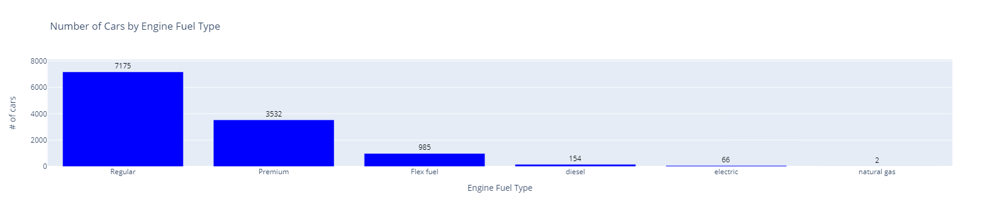

In [26]:
fig = go.Figure()

engine_fuel_counts = car_dataset['Engine Fuel Type'].value_counts()

fig.add_trace(go.Bar(
    x=engine_fuel_counts.index,
    y=engine_fuel_counts,
    marker_color='blue'
))

for i, count in enumerate(engine_fuel_counts):
    fig.add_annotation(
        x=engine_fuel_counts.index[i],
        y=count + 0.5,
        text=str(count),
        showarrow=False,
        font=dict(color='black', size=12),
        xanchor='center',
        yanchor='bottom'
    )

fig.update_layout(
    title="Number of Cars by Engine Fuel Type",
    xaxis_title="Engine Fuel Type",
    yaxis_title="# of cars"
)

fig.show()


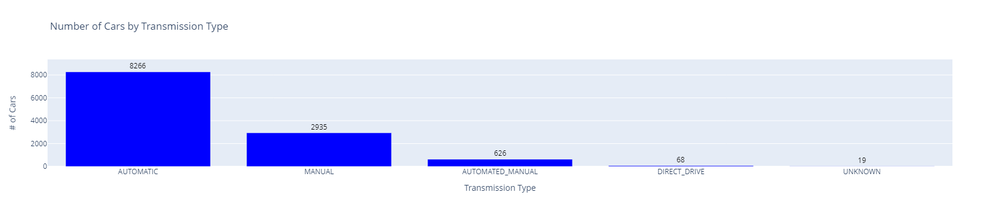

In [27]:
fig = go.Figure()

transmission_counts = car_dataset['Transmission'].value_counts()

fig.add_trace(go.Bar(
    x=transmission_counts.index,
    y=transmission_counts.values,
    marker_color='blue'
))

for i, count in enumerate(transmission_counts.values):
    fig.add_annotation(
        x=transmission_counts.index[i],
        y=count + 0.5,
        text=str(int(count)),
        showarrow=False,
        font=dict(color='black', size=12),
        xanchor='center',
        yanchor='bottom'
    )

fig.update_layout(
    title="Number of Cars by Transmission Type",
    xaxis_title="Transmission Type",
    yaxis_title="# of Cars"
)

fig.show()


In [28]:
car_dataset[car_dataset['Transmission']=='UNKNOWN']

,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price
1289,Oldsmobile,Achieva,1997,Regular,150.0,4.0,UNKNOWN,front wheel drive,2.0,Midsize,Coupe,29,19,26,2000
1290,Oldsmobile,Achieva,1997,Regular,150.0,4.0,UNKNOWN,front wheel drive,4.0,Midsize,Sedan,29,19,26,2000
4691,Pontiac,Firebird,2000,Regular,305.0,8.0,UNKNOWN,rear wheel drive,2.0,Midsize,2dr Hatchback,23,15,210,6175
4692,Pontiac,Firebird,2000,Regular,305.0,8.0,UNKNOWN,rear wheel drive,2.0,Midsize,2dr Hatchback,23,15,210,8548
4693,Pontiac,Firebird,2000,Regular,305.0,8.0,UNKNOWN,rear wheel drive,2.0,Midsize,Convertible,23,15,210,9567
6158,GMC,Jimmy,1999,Regular,190.0,6.0,UNKNOWN,rear wheel drive,2.0,Compact,2dr SUV,19,14,549,2182
6160,GMC,Jimmy,1999,Regular,190.0,6.0,UNKNOWN,four wheel drive,2.0,Compact,2dr SUV,19,14,549,2317
6165,GMC,Jimmy,2000,Regular,190.0,6.0,UNKNOWN,rear wheel drive,2.0,Compact,2dr SUV,20,15,549,2407
6174,GMC,Jimmy,2000,Regular,190.0,6.0,UNKNOWN,four wheel drive,2.0,Compact,2dr SUV,18,14,549,2578
6366,Chrysler,Le Baron,1993,Regular,100.0,4.0,UNKNOWN,front wheel drive,2.0,Compact,Coupe,26,21,1013,2000


In [29]:
car_dataset['Transmission'] = car_dataset['Transmission'].replace('UNKNOWN', 'AUTOMATIC')

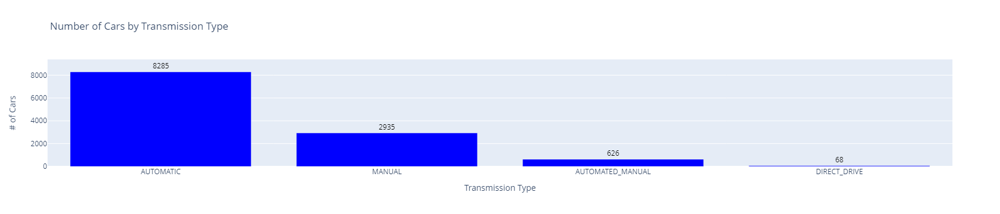

In [30]:
fig = go.Figure()

transmission_counts = car_dataset['Transmission'].value_counts()

fig.add_trace(go.Bar(
    x=transmission_counts.index,
    y=transmission_counts.values,
    marker_color='blue'
))

for i, count in enumerate(transmission_counts.values):
    fig.add_annotation(
        x=transmission_counts.index[i],
        y=count + 0.5,
        text=str(int(count)),
        showarrow=False,
        font=dict(color='black', size=12),
        xanchor='center',
        yanchor='bottom'
    )

fig.update_layout(
    title="Number of Cars by Transmission Type",
    xaxis_title="Transmission Type",
    yaxis_title="# of Cars"
)

fig.show()


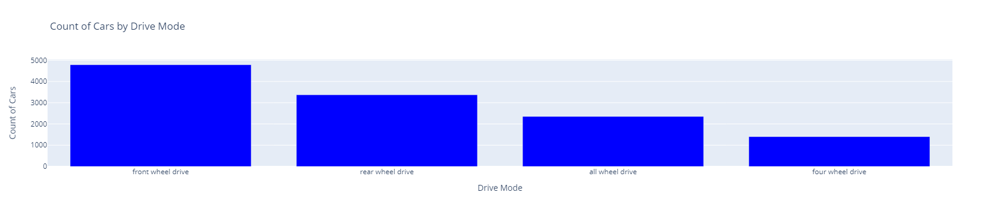

In [31]:
fig = go.Figure()

drive_mode_counts = car_dataset['Drive Mode'].value_counts()

fig.add_trace(go.Bar(
    x=drive_mode_counts.index,
    y=drive_mode_counts.values,
    marker_color='blue'
))

fig.update_layout(
    title="Count of Cars by Drive Mode",
    xaxis_title="Drive Mode",
    yaxis_title="Count of Cars"
)

fig.show()


In [32]:
car_dataset['Drive Mode'] = car_dataset['Drive Mode'].replace('four wheel drive', 'all wheel drive')

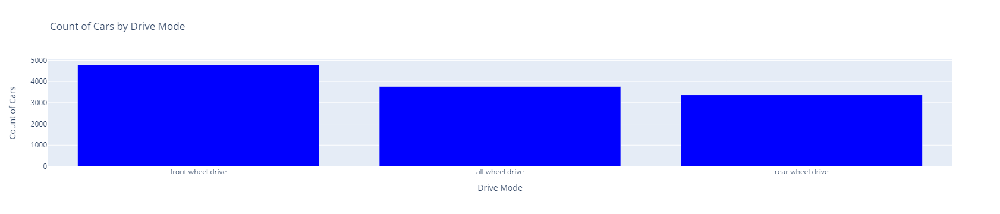

In [33]:
fig = go.Figure()

drive_mode_counts = car_dataset['Drive Mode'].value_counts()

fig.add_trace(go.Bar(
    x=drive_mode_counts.index,
    y=drive_mode_counts.values,
    marker_color='blue'
))

fig.update_layout(
    title="Count of Cars by Drive Mode",
    xaxis_title="Drive Mode",
    yaxis_title="Count of Cars"
)

fig.show()


**Plotly Express--> Box Plot 👇**

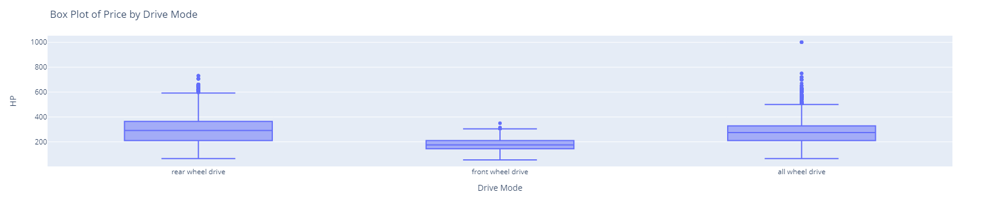

In [34]:
fig = px.box(car_dataset, x='Drive Mode',y='HP')

fig.update_layout(
    title="Box Plot of Price by Drive Mode",
      
)

fig.show()


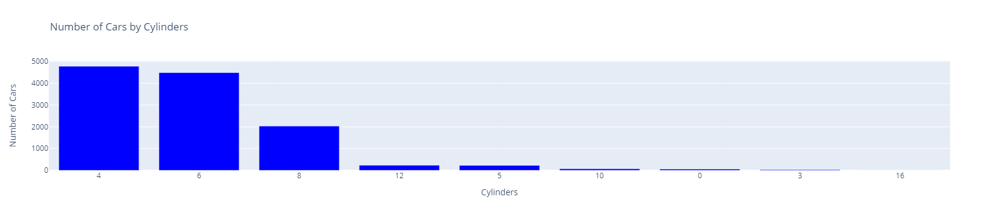

In [35]:
cylinders_counts = df['Cylinders'].value_counts()

fig = go.Figure(data=[go.Bar(
    x=cylinders_counts.index,
    y=cylinders_counts,
    marker_color='blue'
)])

fig.update_layout(
    title="Number of Cars by Cylinders",
    xaxis_title="Cylinders",
    yaxis_title="Number of Cars",
    xaxis=dict(type='category'), # This ensures that the x-axis categories are treated as categories
    yaxis=dict(title='Number of Cars')
)

fig.show()


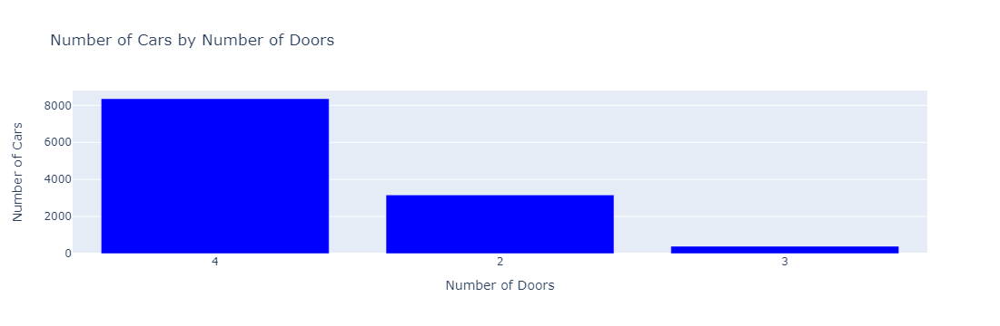

In [36]:
doors_counts = df['Number of Doors'].value_counts()

fig = go.Figure(data=[go.Bar(
    x=doors_counts.index,
    y=doors_counts,
    marker_color='blue' 
)])


fig.update_layout(
    title="Number of Cars by Number of Doors",
    xaxis_title="Number of Doors",
    yaxis_title="Number of Cars",
    xaxis=dict(type='category'), 
    yaxis=dict(title='Number of Cars')
)

fig.show()


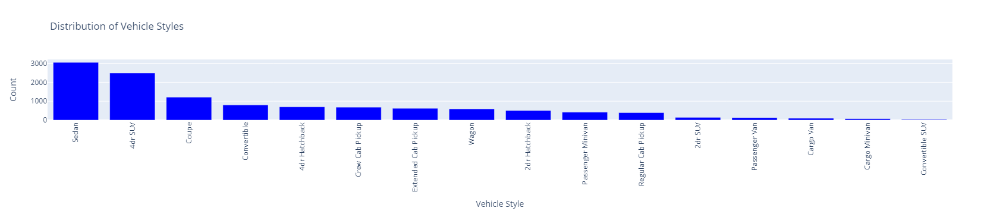

In [37]:

vehicle_style_counts = car_dataset['Vehicle Style'].value_counts()


fig = go.Figure(data=[go.Bar(
    x=vehicle_style_counts.index,
    y=vehicle_style_counts,
    marker_color='blue' 
)])


fig.update_layout(
    title="Distribution of Vehicle Styles",
    xaxis_title="Vehicle Style",
    yaxis_title="Count",
    xaxis_tickangle=-90, 
    xaxis=dict(type='category'),
    yaxis=dict(title='Count')
)

fig.show()


**Combine Vehicle Style**

In [38]:

car_dataset['Vehicle Style'] = car_dataset['Vehicle Style'].replace(['2dr Hatchback', '4dr Hatchback'], 'Hatchback')
car_dataset['Vehicle Style'] = car_dataset['Vehicle Style'].replace(['Crew Cab Pickup','Regular Cab Pickup', 'Extended Cab Pickup'], 'Pickup')
car_dataset['Vehicle Style'] = car_dataset['Vehicle Style'].replace(['4dr SUV', '2dr SUV' , 'Convertible SUV' ], 'SUV')
car_dataset['Vehicle Style'] = car_dataset['Vehicle Style'].replace(['Cargo Van', 'Passenger Van'], 'Van')
car_dataset['Vehicle Style'] = car_dataset['Vehicle Style'].replace(['Passenger Minivan', 'Cargo Minivan'], 'Minivan')


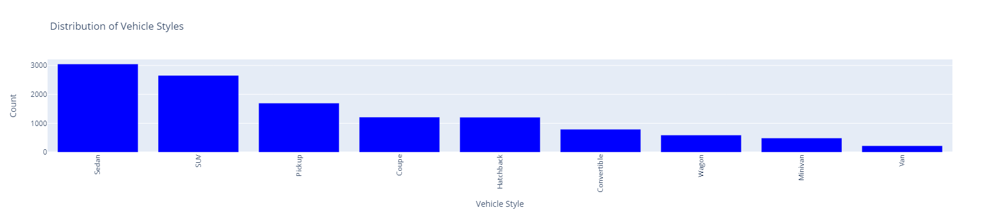

In [39]:

vehicle_style_counts = car_dataset['Vehicle Style'].value_counts()


fig = go.Figure(data=[go.Bar(
    x=vehicle_style_counts.index,
    y=vehicle_style_counts,
    marker_color='blue' 
)])


fig.update_layout(
    title="Distribution of Vehicle Styles",
    xaxis_title="Vehicle Style",
    yaxis_title="Count",
    xaxis_tickangle=-90, 
    xaxis=dict(type='category'),
    yaxis=dict(title='Count')
)

fig.show()


<Axes: >

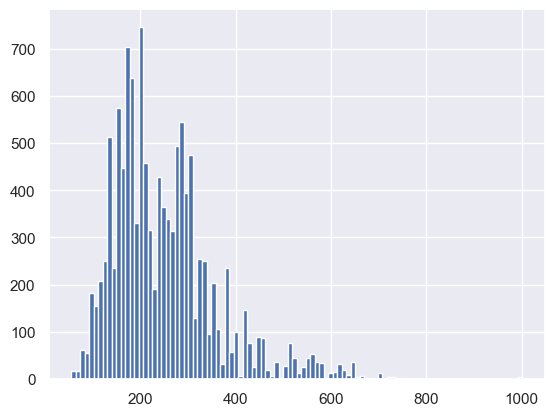

In [40]:
car_dataset['HP'].hist(bins=100)

**"Electric Cars" , "Direct Drive"   and   "Zero Cylinders"  should be the same**

In [41]:
# Filter DataFrame for each condition and print counts
print("Electric Cars Count:", car_dataset[car_dataset['Engine Fuel Type'] == 'electric'].shape[0])
print("Direct Drive Count:", car_dataset[car_dataset['Transmission'] == 'DIRECT_DRIVE'].shape[0])
print("Zero Cylinders Count:", car_dataset[car_dataset['Cylinders'] == 0].shape[0])


Electric Cars Count: 66
Direct Drive Count: 68
Zero Cylinders Count: 56


In [42]:
direct_drive_sample = car_dataset[car_dataset['Transmission'] == 'DIRECT_DRIVE'].head()
print("Sample of Cars with Direct Drive Transmission:")

direct_drive_sample


Sample of Cars with Direct Drive Transmission:


,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price
539,FIAT,500e,2015,electric,249.38607,0.0,DIRECT_DRIVE,front wheel drive,2.0,Compact,Hatchback,108,122,819,31800
540,FIAT,500e,2016,electric,249.38607,0.0,DIRECT_DRIVE,front wheel drive,2.0,Compact,Hatchback,103,121,819,31800
541,FIAT,500e,2017,electric,249.38607,0.0,DIRECT_DRIVE,front wheel drive,2.0,Compact,Hatchback,103,121,819,31800
1680,Mercedes-Benz,B-Class Electric Drive,2015,electric,177.00000,0.0,DIRECT_DRIVE,front wheel drive,4.0,Compact,Hatchback,82,85,617,41450
1681,Mercedes-Benz,B-Class Electric Drive,2016,electric,177.00000,0.0,DIRECT_DRIVE,front wheel drive,4.0,Compact,Hatchback,82,85,617,41450


In [43]:
car_dataset.loc[car_dataset['Transmission'] == 'DIRECT_DRIVE', 'Engine Fuel Type'] = 'Electric'
car_dataset.loc[car_dataset['Transmission'] == 'DIRECT_DRIVE', 'Cylinders'] = 0
electric_cars_count = car_dataset[car_dataset['Engine Fuel Type'] == 'Electric'].shape[0]
zero_cylinders_count = car_dataset[car_dataset['Cylinders'] == 0].shape[0]
direct_drive_cars = car_dataset[car_dataset['Transmission'] == 'DIRECT_DRIVE'].shape[0]

print("Electric Cars Count after update:", electric_cars_count)
print("Zero Cylinders Count after update:", zero_cylinders_count)
print("DIRECT DRIVE Count after update:",direct_drive_cars)

Electric Cars Count after update: 68
Zero Cylinders Count after update: 68
DIRECT DRIVE Count after update: 68


**NOW --> direct drive cars are also 0 cylinders and electric   😁**

#  Creating new features

In [44]:
current_year = 2024
car_dataset['Age_of_Car'] = current_year - car_dataset['Year']


In [45]:
df.columns

Index(['Make', 'Model', 'Year', 'Engine Fuel Type', 'HP', 'Cylinders',
       'Transmission', 'Drive Mode', 'Number of Doors', 'Vehicle Size',
       'Vehicle Style', 'MPG-H', 'MPG-C', 'Popularity', 'Price', 'Age_of_Car'],
      dtype='object')

In [46]:
car_dataset.head()

,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price,Age_of_Car
0,BMW,1 Series M,2011,Premium,335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135,13
1,BMW,1 Series,2011,Premium,300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650,13
2,BMW,1 Series,2011,Premium,300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350,13
3,BMW,1 Series,2011,Premium,230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450,13
4,BMW,1 Series,2011,Premium,230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500,13


In [47]:
car_dataset.shape

(11914, 16)

In [48]:
df.describe(include='all')

,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price,Age_of_Car
count,11914,11914,11914.000000,11914,11914.000000,11914.000000,11914,11914,11914.000000,11914,11914,11914.000000,11914.000000,11914.000000,1.191400e+04,11914.000000
unique,48,915,NaN,6,NaN,NaN,4,3,NaN,3,9,NaN,NaN,NaN,NaN,NaN
top,Chevrolet,Silverado 1500,NaN,Regular,NaN,NaN,AUTOMATIC,front wheel drive,NaN,Compact,Sedan,NaN,NaN,NaN,NaN,NaN
freq,1123,156,NaN,7173,NaN,NaN,8285,4787,NaN,4764,3048,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,2010.384338,NaN,249.386070,5.620698,NaN,NaN,3.436377,NaN,NaN,26.637485,19.733255,1554.911197,4.059474e+04,13.615662
std,NaN,NaN,7.579740,NaN,108.875192,1.788369,NaN,NaN,0.881184,NaN,NaN,8.863001,8.987798,1441.855347,6.010910e+04,7.579740
min,NaN,NaN,1990.000000,NaN,55.000000,0.000000,NaN,NaN,2.000000,NaN,NaN,12.000000,7.000000,2.000000,2.000000e+03,7.000000
25%,NaN,NaN,2007.000000,NaN,170.000000,4.000000,NaN,NaN,2.000000,NaN,NaN,22.000000,16.000000,549.000000,2.100000e+04,8.000000
50%,NaN,NaN,2015.000000,NaN,227.000000,6.000000,NaN,NaN,4.000000,NaN,NaN,26.000000,18.000000,1385.000000,2.999500e+04,9.000000
75%,NaN,NaN,2016.000000,NaN,300.000000,6.000000,NaN,NaN,4.000000,NaN,NaN,30.000000,22.000000,2009.000000,4.223125e+04,17.000000


C:\Users\Hossam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Hossam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Hossam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Hossam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Hossam\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed

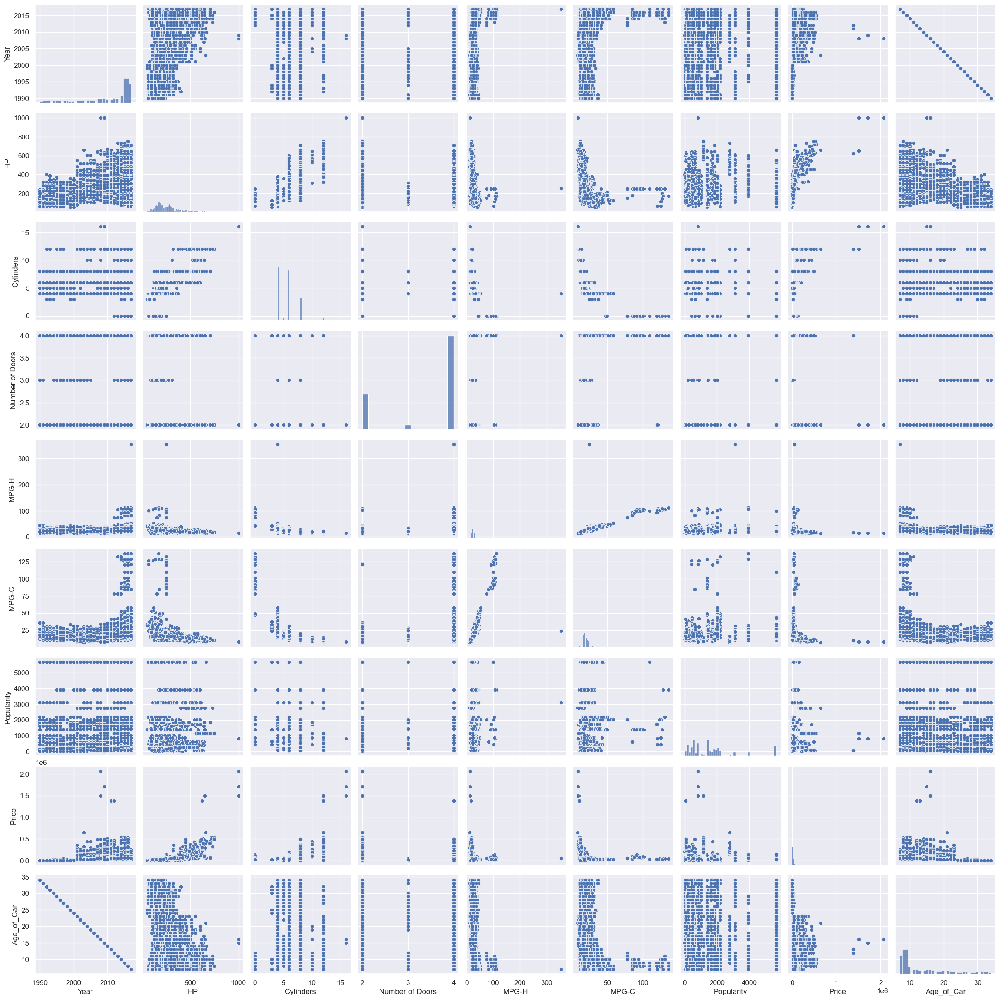

In [49]:
sns.pairplot(data=df)

# DATA ENCODING 

In [50]:


# Select the categorical columns for one-hot encoding
categorical_cols = ['Make', 'Model', 'Engine Fuel Type', 'Transmission', 'Drive Mode', 'Vehicle Size', 'Vehicle Style']

# Perform one-hot encoding
encoded_data = pd.get_dummies(car_dataset, columns=categorical_cols)




In [51]:
encoded_data.head()

,Year,HP,Cylinders,Number of Doors,MPG-H,MPG-C,Popularity,Price,Age_of_Car,Make_Acura,...,Vehicle Size_Midsize,Vehicle Style_Convertible,Vehicle Style_Coupe,Vehicle Style_Hatchback,Vehicle Style_Minivan,Vehicle Style_Pickup,Vehicle Style_SUV,Vehicle Style_Sedan,Vehicle Style_Van,Vehicle Style_Wagon
0,2011,335.0,6.0,2.0,26,19,3916,46135,13,False,...,False,False,True,False,False,False,False,False,False,False
1,2011,300.0,6.0,2.0,28,19,3916,40650,13,False,...,False,True,False,False,False,False,False,False,False,False
2,2011,300.0,6.0,2.0,28,20,3916,36350,13,False,...,False,False,True,False,False,False,False,False,False,False
3,2011,230.0,6.0,2.0,28,18,3916,29450,13,False,...,False,False,True,False,False,False,False,False,False,False
4,2011,230.0,6.0,2.0,28,18,3916,34500,13,False,...,False,True,False,False,False,False,False,False,False,False


In [52]:
encoded_data.shape

(11914, 997)

# Data Scaling

In [53]:
scaler = StandardScaler()
encoded_data_scaled = scaler.fit_transform(encoded_data)
encoded_data_scaled = pd.DataFrame(encoded_data_scaled, columns=encoded_data.columns)

encoded_data_scaled.head()


,Year,HP,Cylinders,Number of Doors,MPG-H,MPG-C,Popularity,Price,Age_of_Car,Make_Acura,...,Vehicle Size_Midsize,Vehicle Style_Convertible,Vehicle Style_Coupe,Vehicle Style_Hatchback,Vehicle Style_Minivan,Vehicle Style_Pickup,Vehicle Style_SUV,Vehicle Style_Sedan,Vehicle Style_Van,Vehicle Style_Wagon
0,0.081228,0.786382,0.212102,-1.630122,-0.071930,-0.081587,1.637604,0.092174,-0.081228,-0.146999,...,-0.761509,-0.267033,2.972903,-0.335908,-0.206663,-0.407408,-0.535489,-0.586332,-0.13811,-0.228665
1,0.081228,0.464900,0.212102,-1.630122,0.153737,-0.081587,1.637604,0.000919,-0.081228,-0.146999,...,-0.761509,3.744858,-0.336372,-0.335908,-0.206663,-0.407408,-0.535489,-0.586332,-0.13811,-0.228665
2,0.081228,0.464900,0.212102,-1.630122,0.153737,0.029680,1.637604,-0.070620,-0.081228,-0.146999,...,-0.761509,-0.267033,2.972903,-0.335908,-0.206663,-0.407408,-0.535489,-0.586332,-0.13811,-0.228665
3,0.081228,-0.178065,0.212102,-1.630122,0.153737,-0.192853,1.637604,-0.185416,-0.081228,-0.146999,...,-0.761509,-0.267033,2.972903,-0.335908,-0.206663,-0.407408,-0.535489,-0.586332,-0.13811,-0.228665
4,0.081228,-0.178065,0.212102,-1.630122,0.153737,-0.192853,1.637604,-0.101399,-0.081228,-0.146999,...,-0.761509,3.744858,-0.336372,-0.335908,-0.206663,-0.407408,-0.535489,-0.586332,-0.13811,-0.228665


# DATA Split to TRAIN and TEST

In [54]:
X = encoded_data_scaled.drop('Price' , axis=1)  # Features
y = encoded_data_scaled['Price']  # Target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [55]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (9531, 996)
Shape of X_test: (2383, 996)
Shape of y_train: (9531,)
Shape of y_test: (2383,)


# Machine Models 
**WITHOUT 'Feature selection' OR 'PCA'**

## LR

In [56]:
from sklearn.linear_model import LinearRegression

In [57]:
# Initialize the Linear Regression model
lr_model = LinearRegression()

In [58]:
# Fit the model to the training data
lr_model.fit(X_train, y_train)

LinearRegression()

In [59]:
# Make predictions on the testing data
lr_y_pred = lr_model.predict(X_test)

In [60]:
# Calculate the Mean Squared Error (MSE) on the testing data
lr_mse = mean_squared_error(y_test, lr_y_pred)
print("Mean Squared Error (MSE):", lr_mse)

lr_mae = mean_absolute_error(y_test, lr_y_pred)
print("Mean Absolute Error (MAE):", lr_mae)

lr_r2 = r2_score(y_test, lr_y_pred)
print("R-squared (R2):", lr_r2)

Mean Squared Error (MSE): 4.821168584531398e+25
Mean Absolute Error (MAE): 479977891199.2685
R-squared (R2): -7.307493876661451e+25


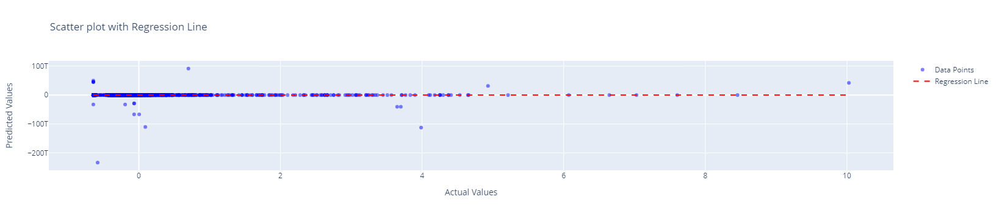

In [61]:
fig = go.Figure()


fig.add_trace(go.Scatter(x=y_test, y=lr_y_pred, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))


fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))


fig.update_layout(
    title="Scatter plot with Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)


fig.show()


## SVR 


In [62]:
from sklearn.svm import SVR

In [63]:
svr_model = SVR(kernel='rbf')  #'linear', 'poly', 'rbf', etc.
svr_model.fit(X_train, y_train) 

SVR()

In [64]:
svr_y_pred = svr_model.predict(X_test)

In [65]:
svr_mse = mean_squared_error(y_test, svr_y_pred)
print("Mean Squared Error (MSE):", svr_mse)

svr_mae = mean_absolute_error(y_test, svr_y_pred)
print("Mean Absolute Error (MAE):", svr_mae)

svr_r2 = r2_score(y_test, svr_y_pred)
print("R-squared (R2):", svr_r2 )

Mean Squared Error (MSE): 0.10595843550346881
Mean Absolute Error (MAE): 0.1001207772135795
R-squared (R2): 0.8393977300220287


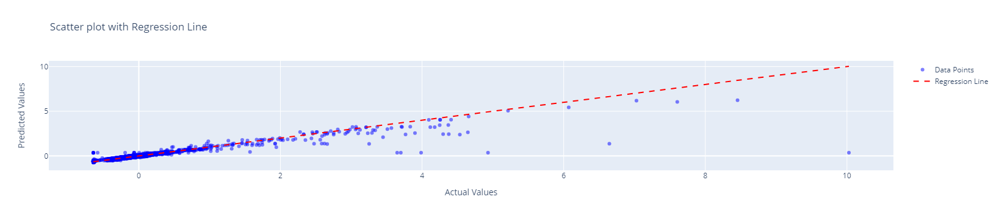

In [66]:
fig = go.Figure()


fig.add_trace(go.Scatter(x=y_test, y=svr_y_pred, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))


fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))

fig.update_layout(
    title="Scatter plot with Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)


fig.show()


## SVR WITH GRID-SEARCH-CV

In [67]:
from sklearn.model_selection import GridSearchCV

In [68]:
param_grid = {'C': [0.1,1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

In [69]:
grid = GridSearchCV(SVR(),param_grid,refit=True,verbose=3)  #CV=5 fold cross-validation by default.

In [70]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.068 total time=  18.3s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.139 total time=  18.6s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.073 total time=  17.8s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.086 total time=  17.9s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.097 total time=  17.5s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.096 total time=  15.0s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.196 total time=  15.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.107 total time=  14.9s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.117 total time=  15.3s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.137 total time=  15.0s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.142 total time=  12.7s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVR(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [71]:
grid.best_params_

{'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}

In [72]:
grid.best_estimator_

SVR(C=1000, gamma=0.0001)

In [73]:
grid_predictions = grid.predict(X_test)

In [74]:
grid_mse = mean_squared_error(y_test, grid_predictions)
print("Mean Squared Error (MSE):", grid_mse)

grid_mae = mean_absolute_error(y_test, grid_predictions)
print("Mean Absolute Error (MAE):", grid_mae)

grid_r2 = r2_score(y_test, grid_predictions)
print("R-squared (R2):", grid_r2)

Mean Squared Error (MSE): 0.05177218062978839
Mean Absolute Error (MAE): 0.08054705973904276
R-squared (R2): 0.9215283833576292


**BEST FIT😎**

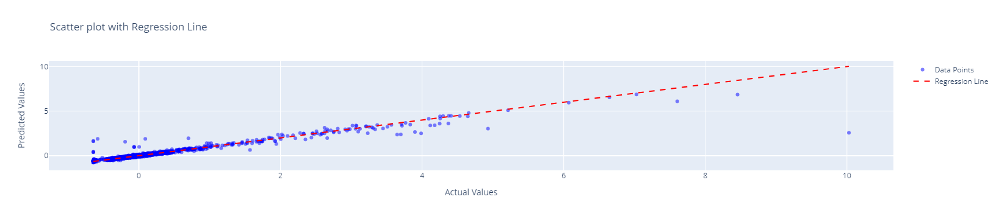

In [75]:

fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=grid_predictions, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))

fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))

fig.update_layout(
    title="Scatter plot with Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)


fig.show()


## K-Mean

In [76]:
from sklearn.cluster import KMeans

**K selection by elbow technique**

In [77]:
inertia_values = []
k_values = range(1, 20)
for k in k_values:
    
    kmeans =  KMeans(n_clusters=k, random_state=42)
    kmeans.fit(encoded_data)
    inertia_values.append(kmeans.inertia_)

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of

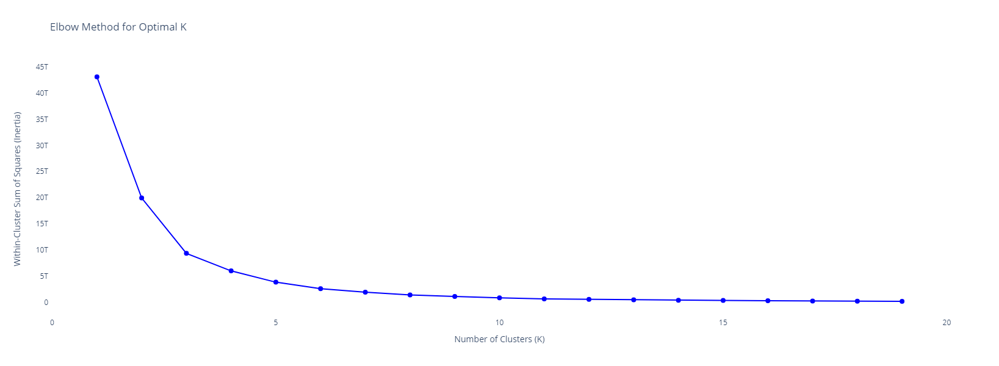

In [78]:

# Convert range object to list
k_values_list = list(k_values)

# Create trace for the elbow curve
elbow_trace = go.Scatter(
    x=k_values_list,
    y=inertia_values,
    mode='lines+markers',
    marker=dict(color='blue', symbol='circle', size=8),
    line=dict(color='blue', width=2),
    name='Elbow Curve'
)

# Create layout
layout = go.Layout(
    title='Elbow Method for Optimal K',
    xaxis=dict(title='Number of Clusters (K)'),
    yaxis=dict(title='Within-Cluster Sum of Squares (Inertia)'),
    hovermode='closest',
    showlegend=False,
    plot_bgcolor='rgba(0, 0, 0, 0)',
    width=1000,
    height=600
)

# Create figure
fig = go.Figure(data=[elbow_trace], layout=layout)

# Show plot
fig.show()


**NOW --> THE BEST K**

In [79]:
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(encoded_data)

# Get cluster labels for each data point
cluster_labels = kmeans.labels_

C:\Users\Hossam\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



## Random Forest 

**RF --> n_estimators=50**

In [80]:
from sklearn.ensemble import RandomForestRegressor

In [81]:
rf_model = RandomForestRegressor(n_estimators=50, random_state=42)

rf_model.fit(X_train, y_train)

rf_y_pred = rf_model.predict(X_test)

In [82]:
rf_mse = mean_squared_error(y_test, rf_y_pred)
print("Mean Squared Error (MSE):", rf_mse)

rf_mae = mean_absolute_error(y_test,rf_y_pred)
print("Mean Absolute Error (MAE):", rf_mae)

rf_r2 = r2_score(y_test, rf_y_pred)
print("R-squared (R2):", rf_r2)

Mean Squared Error (MSE): 0.01906080169022923
Mean Absolute Error (MAE): 0.05085484472126036
R-squared (R2): 0.9711093505249938


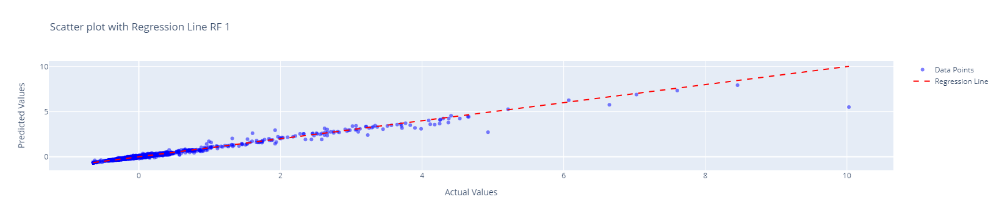

In [83]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=rf_y_pred, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))

fig.update_layout(
    title="Scatter plot with Regression Line RF 1",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


## Feature Importance 

In [84]:
key=X.keys()
# key فيها كل اسماء columns
key
     

Index(['Year', 'HP', 'Cylinders', 'Number of Doors', 'MPG-H', 'MPG-C',
       'Popularity', 'Age_of_Car', 'Make_Acura', 'Make_Alfa Romeo',
       ...
       'Vehicle Size_Midsize', 'Vehicle Style_Convertible',
       'Vehicle Style_Coupe', 'Vehicle Style_Hatchback',
       'Vehicle Style_Minivan', 'Vehicle Style_Pickup', 'Vehicle Style_SUV',
       'Vehicle Style_Sedan', 'Vehicle Style_Van', 'Vehicle Style_Wagon'],
      dtype='object', length=996)

In [85]:
top_features_indices = rf_model.feature_importances_.argsort()[-10:][::-1]
top_features = [key[i] for i in top_features_indices]
top_importances = rf_model.feature_importances_[top_features_indices]

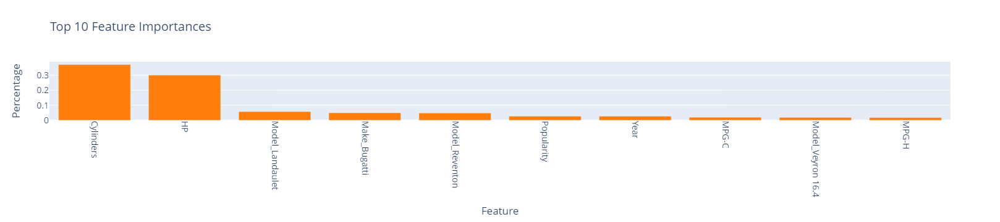

In [86]:
fig = go.Figure()

fig.add_trace(go.Bar(x=top_features, y=top_importances, marker_color='rgb(255, 127, 14)'))

fig.update_layout(title='Top 10 Feature Importances',
                  xaxis_title='Feature',
                  yaxis_title='Percentage',
                  xaxis=dict(tickangle=90),
                  font=dict(size=14))

fig.show()


 ***************************************

**RF --> n_estimators=100**

In [87]:
rf_model_2 = RandomForestRegressor(n_estimators=100, random_state=42)

rf_model_2.fit(X_train, y_train)

rf_2_y_pred = rf_model_2.predict(X_test)

In [88]:
rf_2_mse = mean_squared_error(y_test, rf_2_y_pred)
print("Mean Squared Error (MSE):", rf_2_mse)

rf_2_mae = mean_absolute_error(y_test,rf_2_y_pred)
print("Mean Absolute Error (MAE):", rf_2_mae)

rf_2_r2 = r2_score(y_test, rf_2_y_pred)
print("R-squared (R2):", rf_2_r2)

Mean Squared Error (MSE): 0.01890807365726552
Mean Absolute Error (MAE): 0.05118843082331571
R-squared (R2): 0.9713408419458203


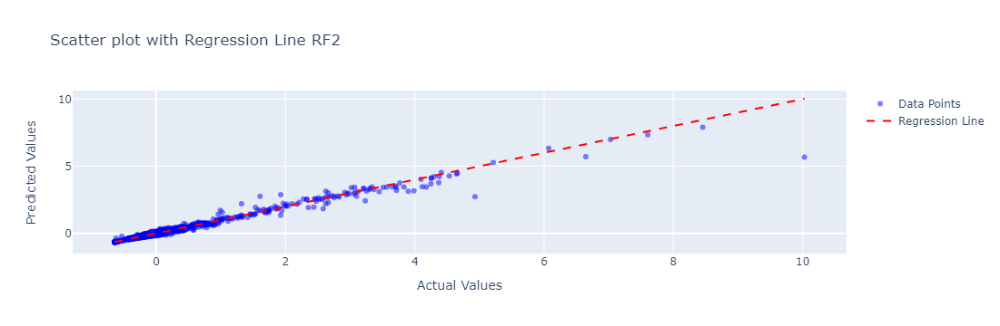

In [89]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=rf_2_y_pred, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))

fig.update_layout(
    title="Scatter plot with Regression Line RF2",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


**RF --> n_estimators=150**

In [90]:
rf_model_3 = RandomForestRegressor(n_estimators=150, random_state=10)

rf_model_3.fit(X_train, y_train)

rf_3_y_pred = rf_model_3.predict(X_test)

In [91]:
rf_3_mse = mean_squared_error(y_test, rf_3_y_pred)
print("Mean Squared Error (MSE):", rf_3_mse)

rf_3_mae = mean_absolute_error(y_test,rf_3_y_pred)
print("Mean Absolute Error (MAE):", rf_3_mae)

rf_3_r2 = r2_score(y_test, rf_3_y_pred)
print("R-squared (R2):", rf_3_r2)

Mean Squared Error (MSE): 0.019534925817729646
Mean Absolute Error (MAE): 0.051315044273330626
R-squared (R2): 0.9703907158002918


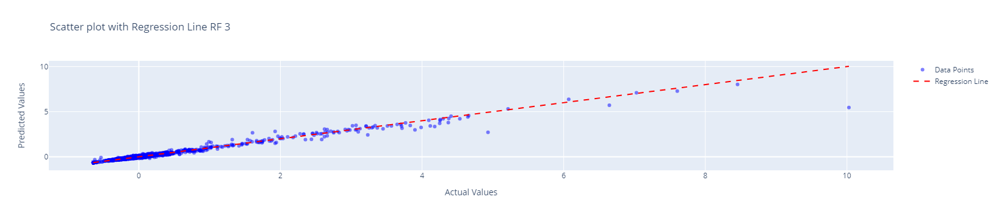

In [92]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=rf_3_y_pred, mode='markers', marker=dict(color='blue', opacity=0.5), name='Data Points'))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', line=dict(color='red', dash='dash'), name='Regression Line'))

fig.update_layout(
    title="Scatter plot with Regression Line RF 3",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


# ANN MODELS 

**MODEL 1**

In [93]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

ann_model = Sequential([
    Dense(64, activation='relu', input_shape=(996,)),
    Dropout(0.2),  
    Dense(32, activation='relu'),
    Dropout(0.2),  
    Dense(1)
])

ann_model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mae'])  
history1 = ann_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

test_loss, test_mae = ann_model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test MAE:", test_mae)


Epoch 1/10


C:\Users\Hossam\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



269/269 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1.6299 - mae: 0.7449 - val_loss: 0.7612 - val_mae: 0.3136
Epoch 2/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5978 - mae: 0.3232 - val_loss: 0.3285 - val_mae: 0.2187
Epoch 3/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2463 - mae: 0.2264 - val_loss: 0.1743 - val_mae: 0.1782
Epoch 4/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2214 - mae: 0.2074 - val_loss: 0.2257 - val_mae: 0.1727
Epoch 5/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1507 - mae: 0.1832 - val_loss: 0.3215 - val_mae: 0.1596
Epoch 6/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1763 - mae: 0.1731 - val_loss: 0.2435 - val_mae: 0.1481
Epoch 7/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2095 - mae: 0.1614 - val_loss: 0.2465 - val_mae: 0.1403
Epoch 8/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1512 - mae: 0.1539 - val_loss: 0.2931 - val_mae: 0.1425
Epoch 9/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1149 

In [94]:
ann_y_pred = ann_model.predict(X_test)

ann_r2 = r2_score(y_test, ann_y_pred)
print("R2 Score  ann 1st model :", ann_r2)

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
R2 Score  ann 1st model : 0.17015579761637012


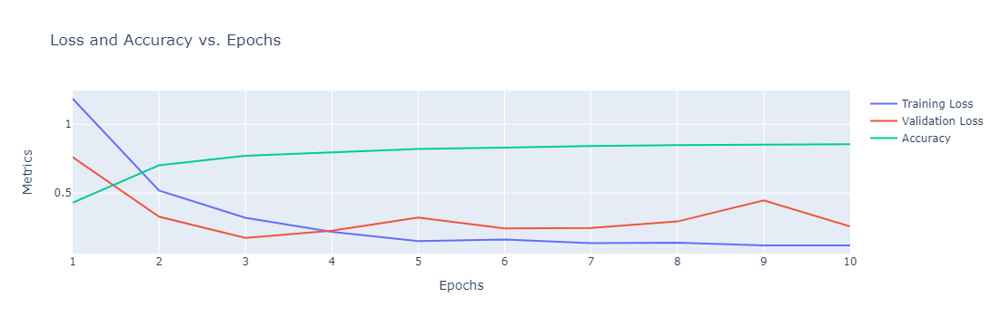

In [95]:
loss = history1.history['loss']
val_loss = history1.history['val_loss']
accuracy = [1 - mae for mae in history1.history['mae']]
epochs = range(1, len(loss) + 1)


epochs_list = list(epochs)

fig = go.Figure()
fig.add_trace(go.Scatter(x=epochs_list, y=loss, mode='lines', name='Training Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=val_loss, mode='lines', name='Validation Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=accuracy, mode='lines', name='Accuracy'))

fig.update_layout(title='Loss and Accuracy vs. Epochs',
                  xaxis_title='Epochs',
                  yaxis_title='Metrics')

fig.show()


*******************************

**MODEL 2**

In [96]:
ann2_model = Sequential([
    Dense(996, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)  
])

ann2_model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mae'])  
history2 = ann2_model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2)


test_2_loss, test_2_mae = ann2_model.evaluate(X_test, y_test)
print("Test Loss  2nd model : ", test_2_loss)
print("Test MAE   2nd model : ", test_2_mae)


Epoch 1/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.5827 - mae: 0.3181 - val_loss: 0.2403 - val_mae: 0.2572
Epoch 2/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2152 - mae: 0.1706 - val_loss: 0.3416 - val_mae: 0.1415
Epoch 3/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2305 - mae: 0.1208 - val_loss: 0.4104 - val_mae: 0.1306
Epoch 4/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.2101 - mae: 0.1184 - val_loss: 0.1094 - val_mae: 0.1144
Epoch 5/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0675 - mae: 0.0861 - val_loss: 0.9308 - val_mae: 0.1704
Epoch 6/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.2796 - mae: 0.1188 - val_loss: 0.2074 - val_mae: 0.1158
Epoch 7/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1957 - mae: 0.0931 - val_loss: 0.6901 - val_mae: 0.1693
Epoch 8/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.1140 - mae: 0.0972 - val_loss: 0.4954 - val_mae: 0.1527
Epoch 9/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - lo

In [97]:
ann2_y_pred = ann2_model.predict(X_test)

ann_2_r2 = r2_score(y_test, ann2_y_pred)
print("R2 Score  ann 2nd model :", ann_2_r2)

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
R2 Score  ann 2nd model : 0.9340974615632384


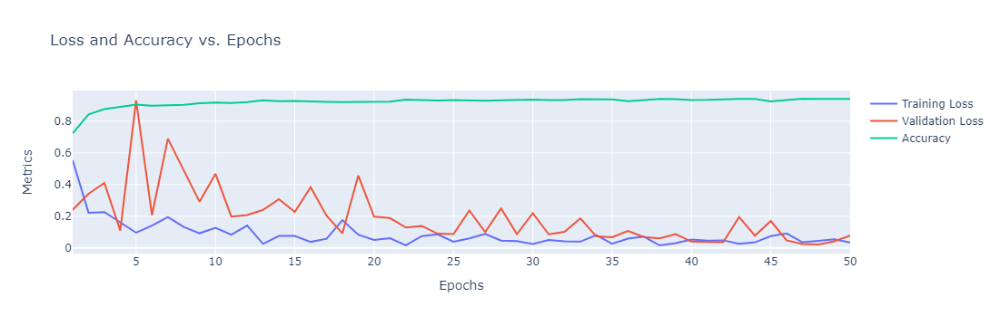

In [98]:
loss = history2.history['loss']
val_loss = history2.history['val_loss']
accuracy = [1 - mae for mae in history2.history['mae']]
epochs = range(1, len(loss) + 1)


epochs_list = list(epochs)

fig = go.Figure()
fig.add_trace(go.Scatter(x=epochs_list, y=loss, mode='lines', name='Training Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=val_loss, mode='lines', name='Validation Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=accuracy, mode='lines', name='Accuracy'))

fig.update_layout(title='Loss and Accuracy vs. Epochs',
                  xaxis_title='Epochs',
                  yaxis_title='Metrics')

fig.show()


***************

**MODEL 3**

In [99]:
# Define the ANN architecture
ann3_model = Sequential([
    Dense(128, activation='relu' ,input_shape=(996,)),
    Dense(64, activation='relu'),
    
    Dense(32, activation='relu'),
    
    Dense(1)  
])

ann3_model.compile(optimizer='adam',loss='mean_squared_error', metrics=['mae'])

history3 = ann3_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Epoch 1/10


C:\Users\Hossam\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



269/269 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3052 - mae: 0.4149 - val_loss: 0.2325 - val_mae: 0.1552
Epoch 2/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3472 - mae: 0.1982 - val_loss: 0.0844 - val_mae: 0.1325
Epoch 3/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1029 - mae: 0.1340 - val_loss: 0.2800 - val_mae: 0.1360
Epoch 4/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1242 - mae: 0.1152 - val_loss: 0.0964 - val_mae: 0.1087
Epoch 5/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0732 - mae: 0.0996 - val_loss: 0.2987 - val_mae: 0.1209
Epoch 6/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0392 - mae: 0.0907 - val_loss: 0.0697 - val_mae: 0.1101
Epoch 7/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0408 - mae: 0.0792 - val_loss: 0.1008 - val_mae: 0.0992
Epoch 8/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0377 - mae: 0.0748 - val_loss: 0.1431 - val_mae: 0.1110
Epoch 9/10
269/269 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0608 

In [100]:
# Evaluate the model on test data
test_3_loss, test_3_mae = ann2_model.evaluate(X_test, y_test)
print("Test Loss  3ed model : ", test_3_loss)
print("Test MAE   3ed model : ", test_3_mae)

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0356 - mae: 0.0664
Test Loss  3ed model :  0.04347965493798256
Test MAE   3ed model :  0.06690338253974915


In [101]:
ann3_y_pred = ann3_model.predict(X_test)

ann_3_r2 = r2_score(y_test, ann3_y_pred)
print("R2 Score  ann 3ed model :", ann_3_r2)

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
R2 Score  ann 3ed model : 0.899752034514993


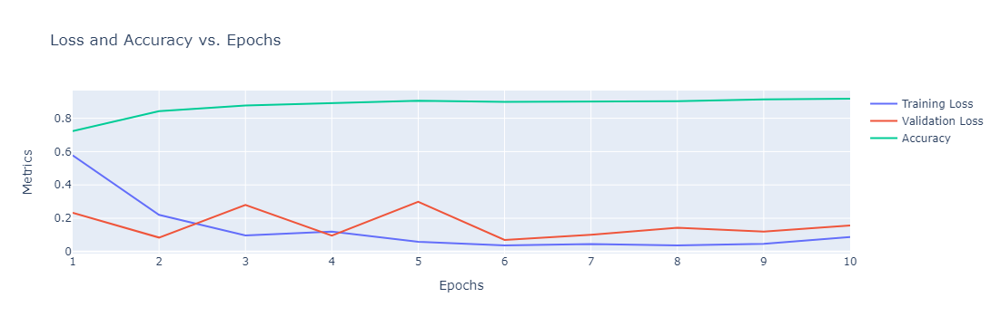

In [102]:
loss = history3.history['loss']
val_loss = history3.history['val_loss']
accuracy = [1 - mae for mae in history2.history['mae']]
epochs = range(1, len(loss) + 1)


epochs_list = list(epochs)

fig = go.Figure()
fig.add_trace(go.Scatter(x=epochs_list, y=loss, mode='lines', name='Training Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=val_loss, mode='lines', name='Validation Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=accuracy, mode='lines', name='Accuracy'))

fig.update_layout(title='Loss and Accuracy vs. Epochs',
                  xaxis_title='Epochs',
                  yaxis_title='Metrics')

fig.show()


# comparative visualization 
**between :**
* Linear Regression
* Random Forest 
* SVR
* SVR Grid Search
* ANN
  

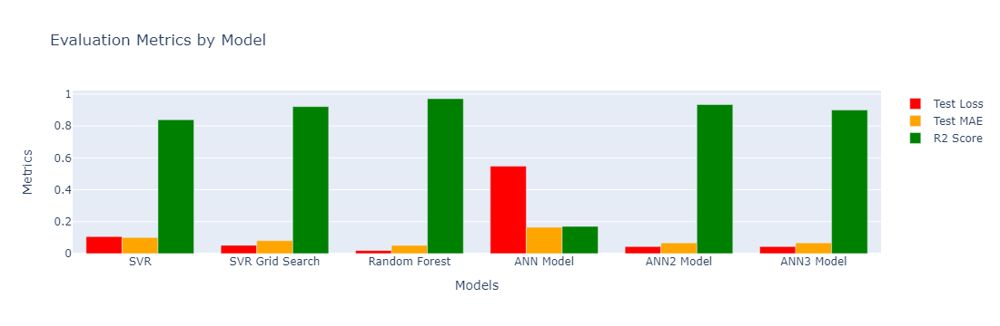

In [103]:

# Define model names and corresponding evaluation metrics
model_names = ['SVR', 'SVR Grid Search', 'Random Forest', 'ANN Model', 'ANN2 Model', 'ANN3 Model']
test_loss_values = [svr_mse, grid_mse, rf_mse, test_loss, test_2_loss, test_3_loss]
test_mae_values = [svr_mae, grid_mae, rf_mae, test_mae, test_2_mae, test_3_mae]
r2_scores = [svr_r2, grid_r2, rf_r2, ann_r2, ann_2_r2, ann_3_r2]

# Create figure
fig = go.Figure()

# Add bar traces for each metric
fig.add_trace(go.Bar(x=model_names, y=test_loss_values, name='Test Loss', marker_color='red'))
fig.add_trace(go.Bar(x=model_names, y=test_mae_values, name='Test MAE', marker_color='orange'))
fig.add_trace(go.Bar(x=model_names, y=r2_scores, name='R2 Score', marker_color='green'))

# Update layout
fig.update_layout(title='Evaluation Metrics by Model',
                  xaxis_title='Models',
                  yaxis_title='Metrics',
                  barmode='group')

# Show plot
fig.show()


# Correlation Matrix

Correlation Matrix:
                      Year        HP  Cylinders  Number of Doors     MPG-H  \
Year             1.000000  0.351288  -0.042717         0.263946  0.258240   
HP               0.351288  1.000000   0.763878        -0.102303 -0.353343   
Cylinders       -0.042717  0.763878   1.000000        -0.141849 -0.621238   
Number of Doors  0.263946 -0.102303  -0.141849         1.000000  0.118925   
MPG-H            0.258240 -0.353343  -0.621238         0.118925  1.000000   
MPG-C            0.198171 -0.346308  -0.594110         0.121206  0.886829   
Popularity       0.073049  0.037315   0.043055        -0.048251 -0.020991   
Price            0.227590  0.661644   0.529059        -0.126081 -0.160043   
Age_of_Car      -1.000000 -0.351288   0.042717        -0.263946 -0.258240   

                    MPG-C  Popularity     Price  Age_of_Car  
Year             0.198171    0.073049  0.227590   -1.000000  
HP              -0.346308    0.037315  0.661644   -0.351288  
Cylinders       -0.594

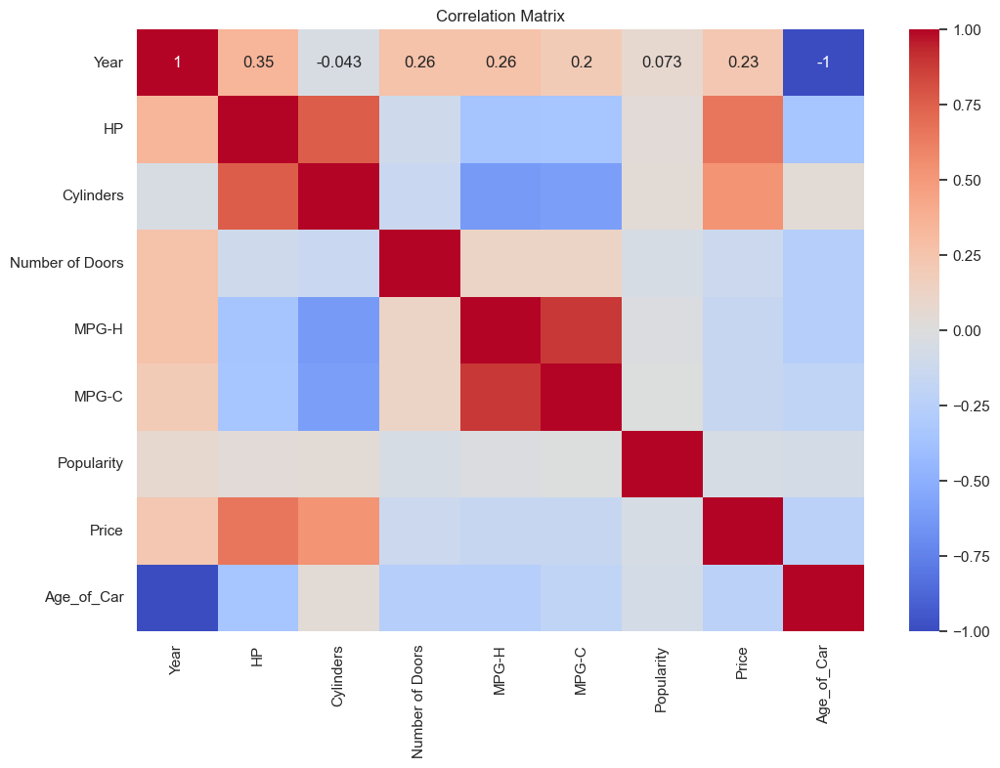

In [104]:
numeric_columns = car_dataset.select_dtypes(include=['number']).columns
correlation_matrix = car_dataset[numeric_columns].corr()
print("Correlation Matrix:\n", correlation_matrix)
plt.figure(figsize=(12, 8))
plt.title('Correlation Matrix')
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

Correlation Matrix:
                      Year        HP  Cylinders  Number of Doors     MPG-H  \
Year             1.000000  0.351288  -0.042717         0.263946  0.258240   
HP               0.351288  1.000000   0.763878        -0.102303 -0.353343   
Cylinders       -0.042717  0.763878   1.000000        -0.141849 -0.621238   
Number of Doors  0.263946 -0.102303  -0.141849         1.000000  0.118925   
MPG-H            0.258240 -0.353343  -0.621238         0.118925  1.000000   
MPG-C            0.198171 -0.346308  -0.594110         0.121206  0.886829   
Popularity       0.073049  0.037315   0.043055        -0.048251 -0.020991   
Price            0.227590  0.661644   0.529059        -0.126081 -0.160043   
Age_of_Car      -1.000000 -0.351288   0.042717        -0.263946 -0.258240   

                    MPG-C  Popularity     Price  Age_of_Car  
Year             0.198171    0.073049  0.227590   -1.000000  
HP              -0.346308    0.037315  0.661644   -0.351288  
Cylinders       -0.594

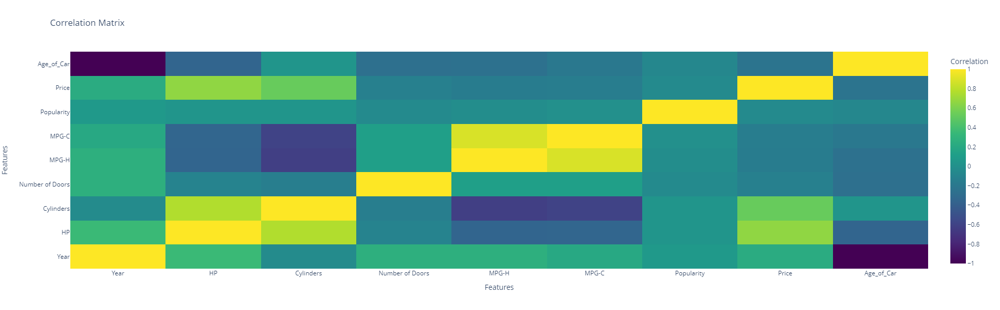

In [105]:
numeric_columns = car_dataset.select_dtypes(include=['number']).columns
correlation_matrix = car_dataset[numeric_columns].corr()
print("Correlation Matrix:\n", correlation_matrix)
# Create heatmap
fig = go.Figure(data=go.Heatmap(
                   z=correlation_matrix.values,
                   x=correlation_matrix.columns,
                   y=correlation_matrix.index,
                   colorscale='Viridis',
                   colorbar=dict(title='Correlation')
                 ))

# Update layout
fig.update_layout(
    title='Correlation Matrix',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features'),
    width=800,
    height=600
)

# Show plot
fig.show()


In [106]:

correlation_with_price = correlation_matrix['Price'].sort_values(ascending=False)
print("Correlation with (Price):\n", correlation_with_price)


Correlation with (Price):
 Price              1.000000
HP                 0.661644
Cylinders          0.529059
Year               0.227590
Popularity        -0.048476
Number of Doors   -0.126081
MPG-C             -0.157676
MPG-H             -0.160043
Age_of_Car        -0.227590
Name: Price, dtype: float64


# Feature selection

In [107]:
merged_data = pd.concat([X, y], axis=1)

correlation_with_price = merged_data.corr()['Price'].sort_values(ascending=False)
correlation_with_price

Price                           1.000000
HP                              0.661644
Cylinders                       0.529059
Make_Bugatti                    0.453253
Model_Veyron 16.4               0.453253
                                  ...   
MPG-C                          -0.157676
MPG-H                          -0.160043
Age_of_Car                     -0.227590
Drive Mode_front wheel drive   -0.239131
Engine Fuel Type_Regular       -0.359840
Name: Price, Length: 997, dtype: float64

In [108]:
threshold = 0.1

In [109]:
positive_corr_features = correlation_with_price[correlation_with_price >= threshold].drop('Price')
negative_corr_features = correlation_with_price[correlation_with_price <= -threshold]

selected_features = pd.concat([positive_corr_features, negative_corr_features])

selected_feature_names = selected_features.index.tolist()

selected_X = X[selected_feature_names]

selected_X

,HP,Cylinders,Make_Bugatti,Model_Veyron 16.4,Engine Fuel Type_Premium,Make_Lamborghini,Make_Maybach,Model_Landaulet,Make_Bentley,Make_Rolls-Royce,...,Model_Phantom Coupe,Model_599,Vehicle Style_Hatchback,Number of Doors,Transmission_MANUAL,MPG-C,MPG-H,Age_of_Car,Drive Mode_front wheel drive,Engine Fuel Type_Regular
0,0.786382,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,-0.335908,-1.630122,1.749081,-0.081587,-0.071930,-0.081228,-0.819555,-1.230029
1,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,-0.335908,-1.630122,1.749081,-0.081587,0.153737,-0.081228,-0.819555,-1.230029
2,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,-0.335908,-1.630122,1.749081,0.029680,0.153737,-0.081228,-0.819555,-1.230029
3,-0.178065,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,-0.335908,-1.630122,1.749081,-0.192853,0.153737,-0.081228,-0.819555,-1.230029
4,-0.178065,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,-0.335908,-1.630122,1.749081,-0.192853,0.153737,-0.081228,-0.819555,-1.230029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11909,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,2.977009,0.639646,-0.571729,-0.415387,-0.410430,-0.213164,-0.819555,-1.230029
11910,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,2.977009,0.639646,-0.571729,-0.415387,-0.410430,-0.213164,-0.819555,-1.230029
11911,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,2.977009,0.639646,-0.571729,-0.415387,-0.410430,-0.213164,-0.819555,-1.230029
11912,0.464900,0.212102,-0.01587,-0.01587,1.540506,-0.06621,-0.036671,-0.012958,-0.079057,-0.051076,...,-0.01587,-0.02049,2.977009,0.639646,-0.571729,-0.415387,-0.410430,-0.345101,-0.819555,-1.230029


# Dimensionality reduction

**FOR THE FEATURES X**

In [110]:
pca = PCA(.95)

pca.fit(selected_X)

X_reduced = pca.fit_transform(selected_X)

# Print the number of components and the explained variance ratio
print("Number of components to explain 90% of variance:", pca.n_components_)

X_reduced_df=pd.DataFrame(X_reduced)
X_reduced_df.shape

Number of components to explain 90% of variance: 30


(11914, 30)

In [111]:
X_train_reduced, X_test_reduced = train_test_split(X_reduced, test_size=0.2, random_state=42)


# NOW WE SHOULD USE THE Reduced "X" --> with the same "y"
# MODELS AFTER PCA

In [112]:
print("Shape of X_train_reduced:",X_train_reduced.shape)
print("Shape of X_test_reduced:",X_test_reduced.shape)

print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train_reduced: (9531, 30)
Shape of X_test_reduced: (2383, 30)
Shape of y_train: (9531,)
Shape of y_test: (2383,)


* LR
* RF
* SVR
* SVR WITH GRID
* ANN

## LR

In [113]:

from sklearn.linear_model import LinearRegression

In [114]:
# Initialize the Linear Regression model
lr_model_with_PCA = LinearRegression()

In [115]:
# Fit the model to the training data
lr_model_with_PCA.fit(X_train_reduced, y_train)

LinearRegression()

In [116]:
# Make predictions on the testing data
lr_y_pred_with_PCA = lr_model_with_PCA.predict(X_test_reduced)

In [117]:
# Calculate the Mean Squared Error (MSE) on the testing data
lr_pca_mse = mean_squared_error(y_test, lr_y_pred_with_PCA)
print("Mean Squared Error (MSE):", lr_pca_mse)

lr_pca_mae = mean_absolute_error(y_test, lr_y_pred_with_PCA)
print("Mean Absolute Error (MAE):", lr_pca_mae)

lr_pca_r2 = r2_score(y_test, lr_y_pred_with_PCA)
print("R-squared (R2):", lr_pca_r2)

Mean Squared Error (MSE): 0.10470809555531317
Mean Absolute Error (MAE): 0.17730649083707414
R-squared (R2): 0.8412928828993222


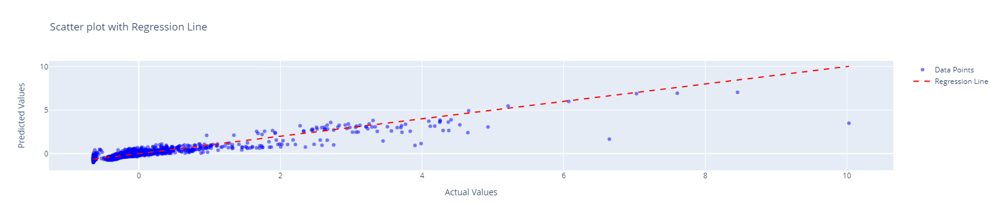

In [118]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=lr_y_pred_with_PCA, mode='markers', name='Data Points', marker=dict(color='blue', opacity=0.5)))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(
    title="Scatter plot with Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


## Random forest 

In [119]:
# Random forest
from sklearn.ensemble import RandomForestRegressor


In [120]:
rf_model_with_PCA = RandomForestRegressor(n_estimators=20, random_state=42)

rf_model_with_PCA.fit(X_train_reduced, y_train)

rf_y_pred_with_PCA = rf_model_with_PCA.predict(X_test_reduced)

In [121]:
rf_pca_mse = mean_squared_error(y_test, rf_y_pred_with_PCA)
print("Mean Squared Error (MSE):", rf_pca_mse)

rf_pca_mae = mean_absolute_error(y_test,rf_y_pred_with_PCA)
print("Mean Absolute Error (MAE):",rf_pca_mae)

rf_pca_r2 = r2_score(y_test, rf_y_pred_with_PCA)
print("R-squared (R2):", rf_pca_r2)

Mean Squared Error (MSE): 0.03857537626628413
Mean Absolute Error (MAE): 0.07147606115003995
R-squared (R2): 0.9415309129076677


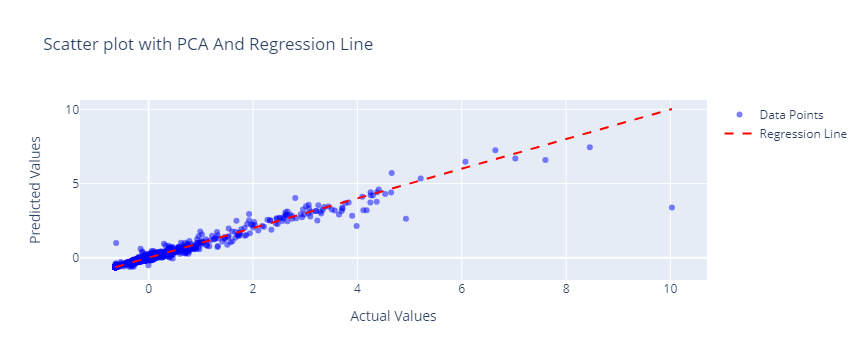

In [122]:

fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=rf_y_pred_with_PCA, mode='markers', name='Data Points', marker=dict(color='blue', opacity=0.5)))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(
    title="Scatter plot with PCA And Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


## SVR

In [123]:
#SVR
from sklearn.svm import SVR


In [124]:
svr_pac_model = SVR(kernel='rbf')  #'linear', 'poly', 'rbf', etc.
svr_pac_model.fit(X_train_reduced, y_train) 

SVR()

In [125]:
svr_y_pred_with_PCA = svr_pac_model.predict(X_test_reduced)

In [126]:
svr_pac_mse = mean_squared_error(y_test, svr_y_pred_with_PCA)
print("Mean Squared Error (MSE):", svr_pac_mse)

svr_pac_mae = mean_absolute_error(y_test, svr_y_pred_with_PCA)
print("Mean Absolute Error (MAE):", svr_pac_mae)

svr_pac_r2 = r2_score(y_test, svr_y_pred_with_PCA)
print("R-squared (R2):", svr_pac_r2 )

Mean Squared Error (MSE): 0.059866076116273835
Mean Absolute Error (MAE): 0.11223905145663242
R-squared (R2): 0.909260384288773


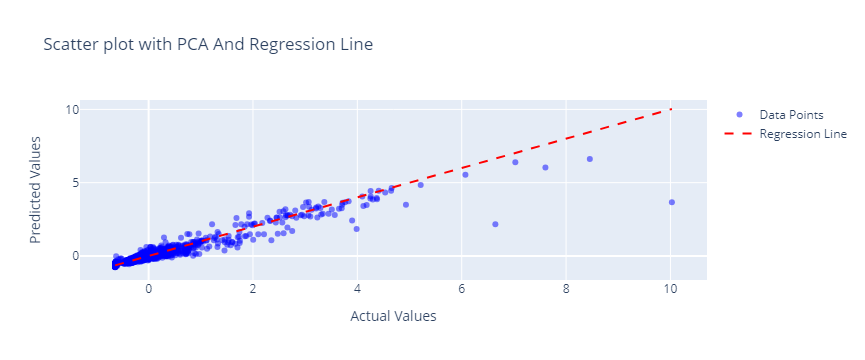

In [127]:

fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=svr_y_pred_with_PCA, mode='markers', name='Data Points', marker=dict(color='blue', opacity=0.5)))
fig.add_trace(go.Scatter(x=[min(y_test), max(y_test)], y=[min(y_test), max(y_test)], mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(
    title="Scatter plot with PCA And Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


## SVR With Grid Search After PCA

In [128]:
param_grid_2 = {'C': [0.1,1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

In [129]:
grid2 = GridSearchCV(SVR(),param_grid_2,refit=True,verbose=3,cv=3)  #CV=5 fold cross-validation by default.

In [130]:
grid2.fit(X_train_reduced,y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV 1/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.138 total time=   1.6s
[CV 2/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.115 total time=   1.5s
[CV 3/3] END ........C=0.1, gamma=1, kernel=rbf;, score=0.183 total time=   1.6s
[CV 1/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.336 total time=   1.5s
[CV 2/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.278 total time=   1.5s
[CV 3/3] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.412 total time=   1.5s
[CV 1/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.567 total time=   1.7s
[CV 2/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.456 total time=   1.8s
[CV 3/3] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.655 total time=   1.7s
[CV 1/3] END ....C=0.1, gamma=0.001, kernel=rbf;, score=0.631 total time=   1.7s
[CV 2/3] END ....C=0.1, gamma=0.001, kernel=rbf;, score=0.511 total time=   1.8s
[CV 3/3] END ....C=0.1, gamma=0.001, kernel=rbf;

GridSearchCV(cv=3, estimator=SVR(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [131]:
grid2.best_params_

{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}

In [132]:
grid2.best_estimator_

SVR(C=1000, gamma=0.01)

In [133]:
grid2_predictions = grid2.predict(X_test_reduced)

In [134]:
grid2_mse = mean_squared_error(y_test, grid2_predictions)
print("Mean Squared Error (MSE):", grid2_mse)

grid2_mae = mean_absolute_error(y_test, grid2_predictions)
print("Mean Absolute Error (MAE):", grid2_mae)

grid2_r2 = r2_score(y_test, grid2_predictions)
print("R-squared (R2):", grid2_r2)

Mean Squared Error (MSE): 0.04447992517921017
Mean Absolute Error (MAE): 0.09603052004945743
R-squared (R2): 0.9325813285342665


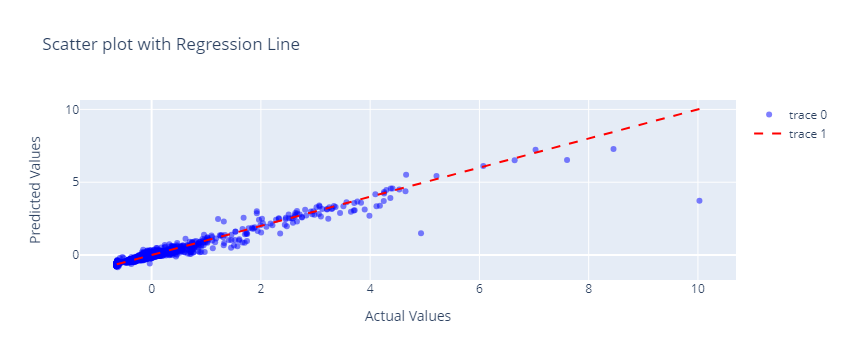

In [135]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=grid2_predictions, mode='markers', marker=dict(color='blue', opacity=0.5)))
fig.add_trace(go.Scatter(x=[max(y_test), min(y_test)], y=[max(y_test), min(y_test)], mode='lines', line=dict(color='red', dash='dash')))

fig.update_layout(
    title="Scatter plot with Regression Line",
    xaxis_title="Actual Values",
    yaxis_title="Predicted Values"
)

fig.show()


## ANN

In [136]:

ann_model_pca = Sequential([
    Dense(819, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)  
])

ann_model_pca.compile(optimizer='adam',loss='mean_squared_error',metrics=['mae'])  
history_pca = ann_model_pca.fit(X_train_reduced, y_train, epochs=50, batch_size=16, validation_split=0.2)


test_pca_loss, test_pca_mae = ann_model_pca.evaluate(X_test_reduced, y_test)
print("Test Loss  2nd model : ", test_pca_loss)
print("Test MAE   2nd model : ", test_pca_mae)


Epoch 1/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 0.9860 - mae: 0.2460 - val_loss: 0.2100 - val_mae: 0.1576
Epoch 2/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2416 - mae: 0.1641 - val_loss: 0.1085 - val_mae: 0.1588
Epoch 3/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2584 - mae: 0.1487 - val_loss: 0.2744 - val_mae: 0.1487
Epoch 4/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.3508 - mae: 0.1633 - val_loss: 0.0707 - val_mae: 0.1333
Epoch 5/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2414 - mae: 0.1401 - val_loss: 0.3503 - val_mae: 0.1365
Epoch 6/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.4749 - mae: 0.1354 - val_loss: 0.0443 - val_mae: 0.1202
Epoch 7/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0493 - mae: 0.1126 - val_loss: 0.0788 - val_mae: 0.1279
Epoch 8/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1607 - mae: 0.1285 - val_loss: 0.0850 - val_mae: 0.1172
Epoch 9/50
477/477 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - lo

In [165]:
ann_pca_y_pred = ann_model_pca.predict(X_test_reduced)

ann_pca_r2 = r2_score(y_test, ann_pca_y_pred)
print("R2 Score  ann  model :", ann_pca_r2)

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 804us/step
R2 Score  ann  model : 0.9337110632652474


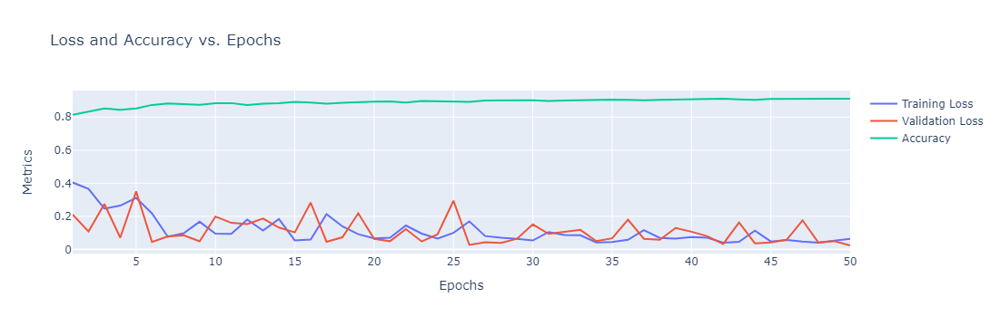

In [166]:
loss = history_pca.history['loss']
val_loss = history_pca.history['val_loss']
accuracy = [1 - mae for mae in history_pca.history['mae']]
epochs = range(1, len(loss) + 1)

fig = go.Figure()
epochs_list = list(epochs)


fig.add_trace(go.Scatter(x=epochs_list, y=loss, mode='lines', name='Training Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=val_loss, mode='lines', name='Validation Loss'))
fig.add_trace(go.Scatter(x=epochs_list, y=accuracy, mode='lines', name='Accuracy'))

fig.update_layout(title='Loss and Accuracy vs. Epochs',
                  xaxis_title='Epochs',
                  yaxis_title='Metrics')

fig.show()


# comparative visualization After PCA
**between :**
* Linear Regression
* Random Forest 
* SVR
* SVR Grid Search
* ANN
  

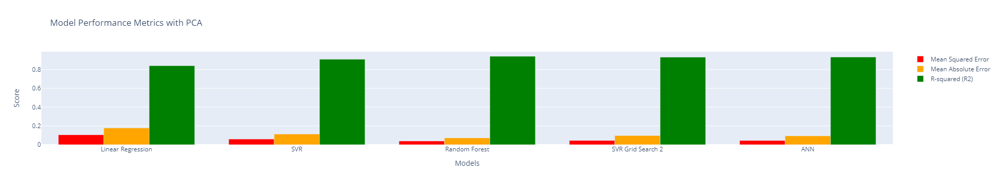

In [139]:
models = ['Linear Regression', 'SVR', 'Random Forest', 'SVR Grid Search 2', 'ANN']
mse_scores = [lr_pca_mse, svr_pac_mse, rf_pca_mse, grid2_mse, test_pca_loss]
mae_scores = [lr_pca_mae, svr_pac_mae, rf_pca_mae, grid2_mae, test_pca_mae]
r2_scores = [lr_pca_r2, svr_pac_r2, rf_pca_r2, grid2_r2, ann_pca_r2]

fig = go.Figure()

fig.add_trace(go.Bar(x=models, y=mse_scores, name='Mean Squared Error', marker_color='red'))
fig.add_trace(go.Bar(x=models, y=mae_scores, name='Mean Absolute Error', marker_color='orange'))
fig.add_trace(go.Bar(x=models, y=r2_scores, name='R-squared (R2)', marker_color='green'))

fig.update_layout(title='Model Performance Metrics with PCA',
                  xaxis_title='Models',
                  yaxis_title='Score',
                  barmode='group')

fig.show()


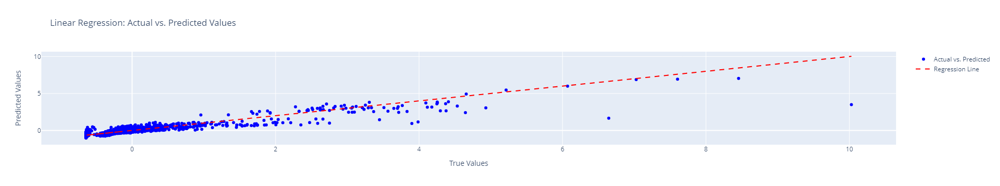

In [140]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=lr_y_pred_with_PCA, mode='markers', name='Actual vs. Predicted', marker=dict(color='blue')))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(title='Linear Regression: Actual vs. Predicted Values',
                  xaxis_title='True Values',
                  yaxis_title='Predicted Values')

fig.show()


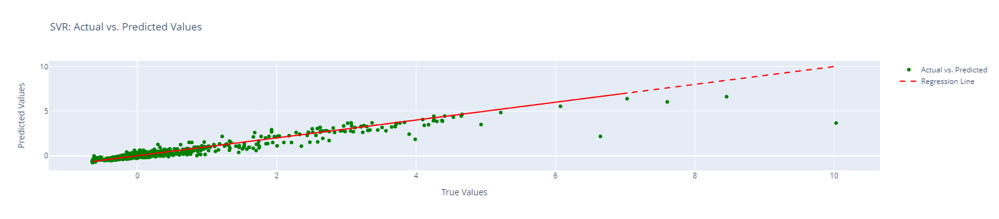

In [141]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=svr_y_pred_with_PCA, mode='markers', name='Actual vs. Predicted', marker=dict(color='green')))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(title='SVR: Actual vs. Predicted Values',
                  xaxis_title='True Values',
                  yaxis_title='Predicted Values')

fig.show()


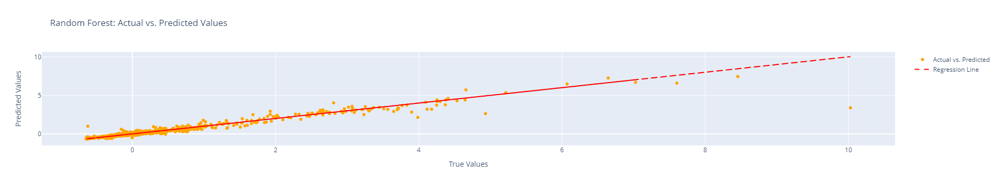

In [142]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=rf_y_pred_with_PCA, mode='markers', name='Actual vs. Predicted', marker=dict(color='orange')))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(title='Random Forest: Actual vs. Predicted Values',
                  xaxis_title='True Values',
                  yaxis_title='Predicted Values')

fig.show()


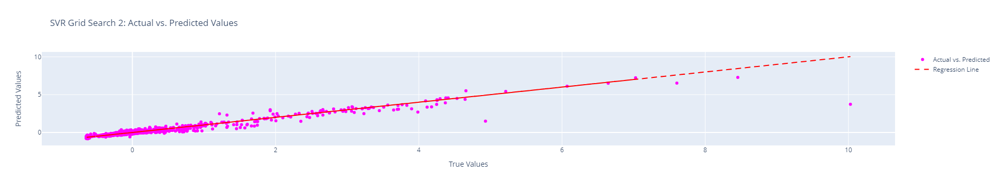

In [143]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=grid2_predictions, mode='markers', name='Actual vs. Predicted', marker=dict(color='magenta')))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(title='SVR Grid Search 2: Actual vs. Predicted Values',
                  xaxis_title='True Values',
                  yaxis_title='Predicted Values')

fig.show()


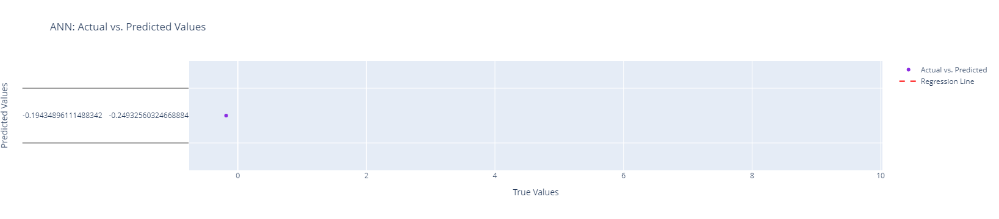

In [171]:

fig = go.Figure()

fig.add_trace(go.Scatter(x=y_test, y=ann_pca_y_pred, mode='markers', name='Actual vs. Predicted', marker=dict(color='blueviolet')))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Regression Line', line=dict(color='red', dash='dash')))

fig.update_layout(title='ANN: Actual vs. Predicted Values',
                  xaxis_title='True Values',
                  yaxis_title='Predicted Values')

fig.show()


# Classification


In [145]:
car_dataset2=df

In [146]:
car_dataset2.head()

,Make,Model,Year,Engine Fuel Type,HP,Cylinders,Transmission,Drive Mode,Number of Doors,Vehicle Size,Vehicle Style,MPG-H,MPG-C,Popularity,Price,Age_of_Car
0,BMW,1 Series M,2011,Premium,335.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,26,19,3916,46135,13
1,BMW,1 Series,2011,Premium,300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,19,3916,40650,13
2,BMW,1 Series,2011,Premium,300.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,20,3916,36350,13
3,BMW,1 Series,2011,Premium,230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Coupe,28,18,3916,29450,13
4,BMW,1 Series,2011,Premium,230.0,6.0,MANUAL,rear wheel drive,2.0,Compact,Convertible,28,18,3916,34500,13


In [147]:
X_c = car_dataset2.drop('Drive Mode' , axis=1)  # Features
y_c = car_dataset2['Drive Mode']  # Target

In [148]:
# One-hot encode categorical variables
X_c_encoded = pd.get_dummies(X_c)

In [149]:
X_c_encoded.shape

(11914, 994)

In [150]:
# Display unique categories in y_c
unique_categories = y_c.unique()
print("Categories in y_c:")
for category in unique_categories:
    print(category)


Categories in y_c:
rear wheel drive
front wheel drive
all wheel drive


In [151]:

category_mapping = {
    'rear wheel drive': 0,
    'front wheel drive': 1,
    'all wheel drive': 2
}


y_c_encoded = y_c.map(category_mapping)


print("Encoded categories in y_c:")
print(y_c_encoded)


Encoded categories in y_c:
0        0
1        0
2        0
3        0
4        0
        ..
11909    2
11910    2
11911    2
11912    2
11913    1
Name: Drive Mode, Length: 11914, dtype: int64


In [152]:
y_c_encoded.shape

(11914,)

In [153]:
X_trainc, X_testc, y_trainc, y_testc = train_test_split(X_c_encoded, y_c_encoded, test_size=0.2, random_state=42)

In [154]:
print("Shape of X_train:", X_trainc.shape)
print("Shape of X_test:", X_testc.shape)
print("Shape of y_train:", y_trainc.shape)
print("Shape of y_test:", y_testc.shape)

Shape of X_train: (9531, 994)
Shape of X_test: (2383, 994)
Shape of y_train: (9531,)
Shape of y_test: (2383,)


In [155]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [156]:
svc_model = SVC()
svc_model.fit(X_trainc, y_trainc)

svc_preds = svc_model.predict(X_testc)

In [157]:
print("Classification Report for SVC:")
print(classification_report(y_testc, svc_preds))

Classification Report for SVC:
              precision    recall  f1-score   support

           0       0.72      0.09      0.16       677
           1       0.53      0.89      0.66       932
           2       0.50      0.47      0.48       774

    accuracy                           0.53      2383
   macro avg       0.58      0.48      0.44      2383
weighted avg       0.57      0.53      0.46      2383



In [158]:
rfc_model = RandomForestClassifier(n_estimators=100)
rfc_model.fit(X_trainc, y_trainc)

# Predictions using Random Forest Classifier
rfc_preds = rfc_model.predict(X_testc)

# Print classification report for Random Forest Classifier
print("\nClassification Report for Random Forest Classifier:")
print(classification_report(y_testc, rfc_preds))


Classification Report for Random Forest Classifier:
              precision    recall  f1-score   support

           0       0.90      0.89      0.90       677
           1       0.96      0.97      0.97       932
           2       0.88      0.87      0.87       774

    accuracy                           0.92      2383
   macro avg       0.91      0.91      0.91      2383
weighted avg       0.92      0.92      0.92      2383



In [159]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [160]:
svc_accuracy = accuracy_score(y_testc, svc_preds)

svc_precision = precision_score(y_testc, svc_preds, average='macro')
svc_recall = recall_score(y_testc, svc_preds, average='macro')
svc_f1 = f1_score(y_testc, svc_preds, average='macro')

print("svc_accuracy:", svc_accuracy)
print("svc_Precision:", svc_precision)
print("svc_Recall:", svc_recall)
print("svc_F1 Score:", svc_f1)

svc_accuracy: 0.5262274443978179
svc_Precision: 0.5833338180979099
svc_Recall: 0.48326826248247484
svc_F1 Score: 0.4364334465368485


In [161]:
rfc_accuracy = accuracy_score(y_testc, rfc_preds)
rfc_precision = precision_score(y_testc, rfc_preds, average='macro')
rfc_recall = recall_score(y_testc, rfc_preds, average='macro')
rfc_f1 = f1_score(y_testc, rfc_preds, average='macro')

print("rfc_accuracy:", rfc_accuracy)
print("rfc_Precision:", rfc_precision)
print("rfc_Recall:", rfc_recall)
print("rfc_F1 Score:", rfc_f1)

rfc_accuracy: 0.916911456147713
rfc_Precision: 0.9127085641221745
rfc_Recall: 0.9121224572376985
rfc_F1 Score: 0.9124044192217667


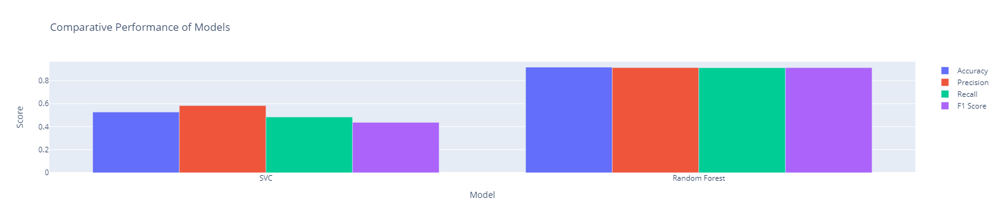

In [162]:
model_names = ['SVC', 'Random Forest']

accuracies = [svc_accuracy, rfc_accuracy]
precisions = [svc_precision, rfc_precision]
recalls = [svc_recall, rfc_recall]
f1_scores = [svc_f1, rfc_f1]


accuracy_trace = go.Bar(x=model_names, y=accuracies, name='Accuracy')
precision_trace = go.Bar(x=model_names, y=precisions, name='Precision')
recall_trace = go.Bar(x=model_names, y=recalls, name='Recall')
f1_score_trace = go.Bar(x=model_names, y=f1_scores, name='F1 Score')

fig = go.Figure(data=[accuracy_trace, precision_trace, recall_trace, f1_score_trace],
                layout=go.Layout(
                    title='Comparative Performance of Models',
                    barmode='group',
                    xaxis=dict(title='Model'),
                    yaxis=dict(title='Score')
                ))

fig.show()

#                                                                       THANK YOU